In [47]:
import pandas as pd
from sklearn.preprocessing import PowerTransformer
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

In [48]:
ruta='../data/processed/df_max.xlsx'

In [ ]:
ruta='../data/processed/df_mean.xlsx'

In [49]:
intact = pd.read_excel(ruta)     

In [50]:
intact

,origin_db,subject,stimulus,Channel 1_VAR_STD,Channel 2_VAR_STD,Channel 3_VAR_STD,Channel 4_VAR_STD,Channel 5_VAR_STD,Channel 6_VAR_STD,Channel 7_VAR_STD,...,Channel 7_MNF,Channel 8_MNF,Channel 1_SSC,Channel 2_SSC,Channel 3_SSC,Channel 4_SSC,Channel 5_SSC,Channel 6_SSC,Channel 7_SSC,Channel 8_SSC
0,NinaProDB1,1,22,1.556622,8.491342,4.807763,0.657234,0.052948,0.126834,6.225271,...,216.338318,153.986437,139.166667,118.000000,143.750000,92.916667,93.333333,97.500000,158.416667,161.583333
1,NinaProDB1,1,25,2.335566,1.654429,2.529078,1.077355,0.065492,0.079775,14.299958,...,196.925029,153.904745,137.333333,93.000000,124.750000,111.333333,81.166667,89.000000,163.166667,168.916667
2,NinaProDB1,1,27,5.408909,3.989522,8.206502,0.474338,0.058332,0.503866,8.516195,...,208.520234,150.899472,145.916667,133.916667,142.500000,98.000000,97.083333,107.833333,157.500000,151.916667
3,NinaProDB1,1,30,18.827876,35.048381,17.412131,3.460524,0.128043,0.105301,15.995140,...,206.973507,148.802810,151.416667,122.916667,140.083333,91.833333,112.083333,101.500000,168.666667,158.916667
4,NinaProDB1,1,31,0.186208,1.404981,6.669579,0.207704,0.078409,0.018098,1.257786,...,170.885424,135.944500,117.416667,102.916667,126.833333,68.416667,104.166667,84.250000,146.916667,161.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
604,NinaProDB5,10,27,5319.329445,13839.804221,4415.694488,838.070796,3446.883784,629.798115,3791.475654,...,1631.565499,1790.451730,850.916667,862.000000,802.916667,750.500000,759.333333,704.333333,796.583333,873.083333
605,NinaProDB5,10,30,5539.788481,7460.248673,1692.826468,1477.550290,4009.287573,576.094752,4899.331778,...,1638.375115,1715.757938,818.166667,796.916667,755.000000,741.583333,744.833333,693.666667,759.416667,846.250000
606,NinaProDB5,10,31,4866.422511,3110.162110,499.535195,401.863167,773.270529,206.696111,556.803403,...,1522.542268,1687.353893,832.750000,751.583333,711.666667,708.583333,723.416667,677.083333,736.500000,827.666667
607,NinaProDB5,10,37,9077.967993,11582.342134,887.275336,1017.972728,1593.046177,1190.567329,7435.456604,...,1648.110260,1692.080245,826.083333,828.166667,742.583333,744.500000,754.000000,692.083333,785.166667,806.166667


In [51]:
features = ['VAR_STD', 'Range', 'Energy', 'Peak_to_Peak', 'VAR', 'Max', 'MNF', 'SSC']
signal_cols = [f'Channel {ch}_{feat}' for ch in range(1, 9) for feat in features]

In [52]:
def boxcox_normalize_corrected(df_raw, signal_cols):
    df = df_raw.copy()

    # Shift por columna (global) - necesario para que Box-Cox reciba valores positivos
    for col in signal_cols:
        min_val = df[col].min()
        if min_val <= 0:
            df[col] = df[col] - min_val + 1.0

    # Transformación por agarre (stimulus)
    transformed_parts = []
    for stimulus, group_idx in df.groupby('stimulus').groups.items():
        transformer = PowerTransformer(method='box-cox', standardize=False)
        df.loc[group_idx, signal_cols] = transformer.fit_transform(df.loc[group_idx, signal_cols])

    return df

In [53]:
def yeojohnson_normalize(df_raw, signal_cols):

    df = df_raw.copy()
    
    for stimulus,group_idx in df.groupby('stimulus').groups.items():
        transformer = PowerTransformer(method='yeo-johnson', standardize=False)
        df.loc[group_idx, signal_cols] = transformer.fit_transform(df.loc[group_idx, signal_cols])
        
    return df

In [54]:
df_boxcox_intact = boxcox_normalize_corrected(intact, signal_cols)
df_yeojohnson_intact = yeojohnson_normalize(intact, signal_cols)

In [55]:
df_boxcox_intact.to_csv('../data/master/intact_boxcox.csv', index=False)
df_yeojohnson_intact.to_csv('../data/master/intact_yeojohnson.csv', index=False)

In [56]:
def plot_histograms_by_channel(df, title):
    features = ['VAR_STD', 'Range', 'Energy', 'Peak_to_Peak', 'VAR', 'Max', 'MNF', 'SSC']
    fig, axes = plt.subplots(2, 4, figsize=(20, 10))
    fig.suptitle(title, fontsize=16)
    for i, feat in enumerate(features):
        ax = axes[i // 4][i % 4]
        vals = df[[f'Channel {ch}_{feat}' for ch in range(1, 9)]].values.flatten()
        sns.histplot(vals, kde=True, ax=ax, bins=20, color='steelblue')
        ax.set_title(feat, fontsize=12)
        ax.set_xlabel('')
    plt.tight_layout()
    plt.show()

In [57]:
def get_features_summary_table(df):
    features = ['VAR_STD', 'Range', 'Energy', 'Peak_to_Peak', 'VAR', 'Max', 'MNF', 'SSC']
    summary_data = []
    
    for feat in features:
        # 1. Extraer y aplanar los datos de los 8 canales para este feature
        # Esto es la misma lógica que usaste en plot_histograms_by_channel
        cols = [f'Channel {ch}_{feat}' for ch in range(1, 9)]
        
        # Verificamos que las columnas existan en el df para evitar errores
        cols_existing = [c for c in cols if c in df.columns]
        vals = df[cols_existing].values.flatten()
        
        # Limpiamos valores NaN para que no afecten los cálculos
        vals = vals[~np.isnan(vals)]
        
        # 2. Calcular estadísticas
        v_min = np.min(vals)
        v_max = np.max(vals)
        v_mean = np.mean(vals)
        v_std = np.std(vals)
        v_range = v_max - v_min
        
        summary_data.append({
            'Característica': feat,
            'Mín': v_min,
            'Máx': v_max,
            'Rango': v_range,
            'Media': v_mean,
            'Desv. Est.': v_std
        })
    
    # 3. Crear DataFrame y renombrar columnas
    df_summary = pd.DataFrame(summary_data)

    return df_summary

In [58]:
## 7. Distribución por estímulo
def plot_kde_by_channel(df, feature, title):
    fig, axes = plt.subplots(2, 4, figsize=(20, 10))
    fig.suptitle(f'{title} — {feature}', fontsize=16)

    for ch in range(1, 9):
        ax = axes[(ch - 1) // 4][(ch - 1) % 4]
        col = f'Channel {ch}_{feature}'
        df_plot = df[['stimulus']].copy()
        df_plot['value'] = df[col].values
        
        sns.kdeplot(data=df_plot, x='value', hue='stimulus', 
                    ax=ax, palette='Set2', fill=False, linewidth=2)
        ax.set_title(f'Channel {ch}', fontsize=12)
        ax.set_xlabel('')
        ax.set_ylabel('')

    plt.tight_layout()
    plt.show()

# Intact

## Original

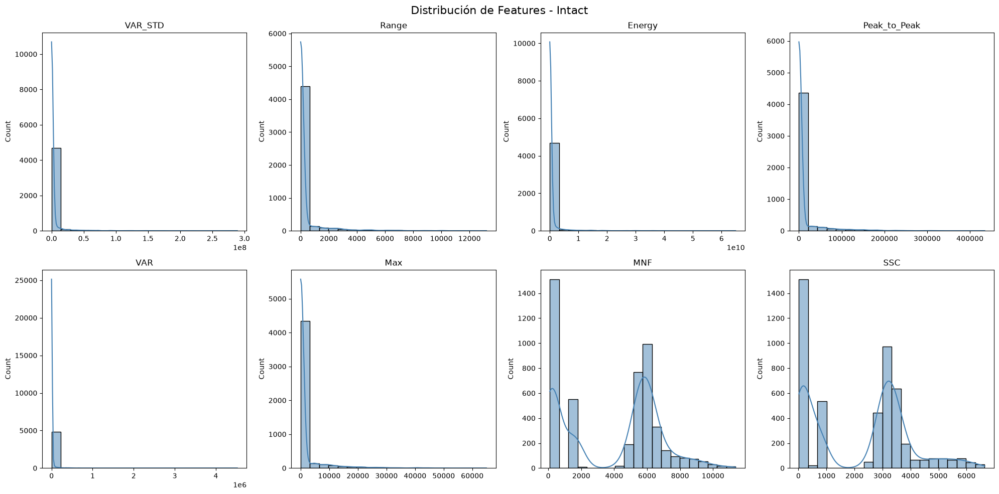

In [59]:
plot_histograms_by_channel(intact, 'Distribución de Features - Intact')

In [60]:
get_features_summary_table(intact)

,Característica,Mín,Máx,Rango,Media,Desv. Est.
0,VAR_STD,1.330848e-12,2.889429e+08,2.889429e+08,2.367078e+06,1.314254e+07
1,Range,4.079969e-07,1.320672e+04,1.320672e+04,2.922058e+02,1.068912e+03
2,Energy,4.843963e-10,6.489215e+10,6.489215e+10,5.412934e+08,3.141542e+09
3,Peak_to_Peak,2.885163e-05,4.345185e+05,4.345185e+05,9.672321e+03,3.395606e+04
4,VAR,6.807607e-16,4.523005e+06,4.523005e+06,9.618865e+03,8.996776e+04
5,Max,5.702268e-06,6.496117e+04,6.496117e+04,1.552726e+03,5.382780e+03
6,MNF,9.029064e+01,1.137184e+04,1.128155e+04,3.838957e+03,2.949461e+03
7,SSC,1.700000e+01,6.648167e+03,6.631167e+03,2.191430e+03,1.754428e+03


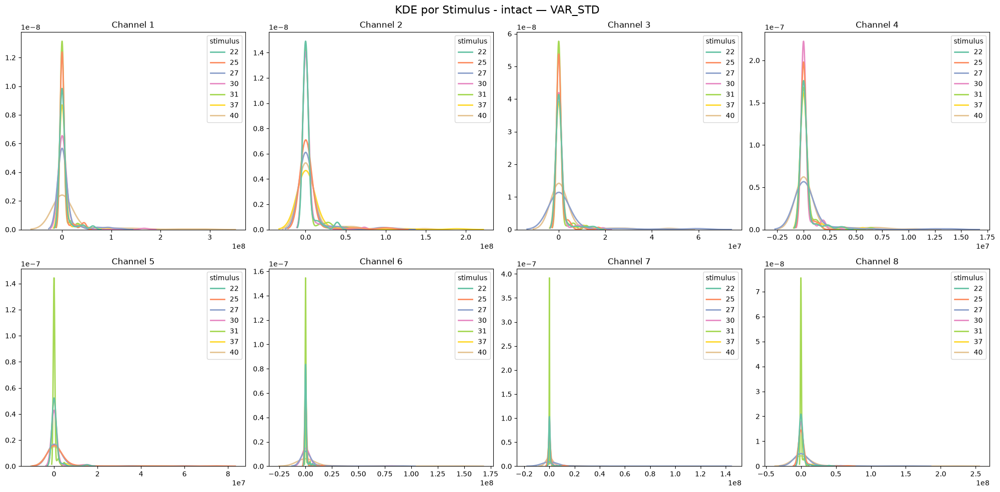

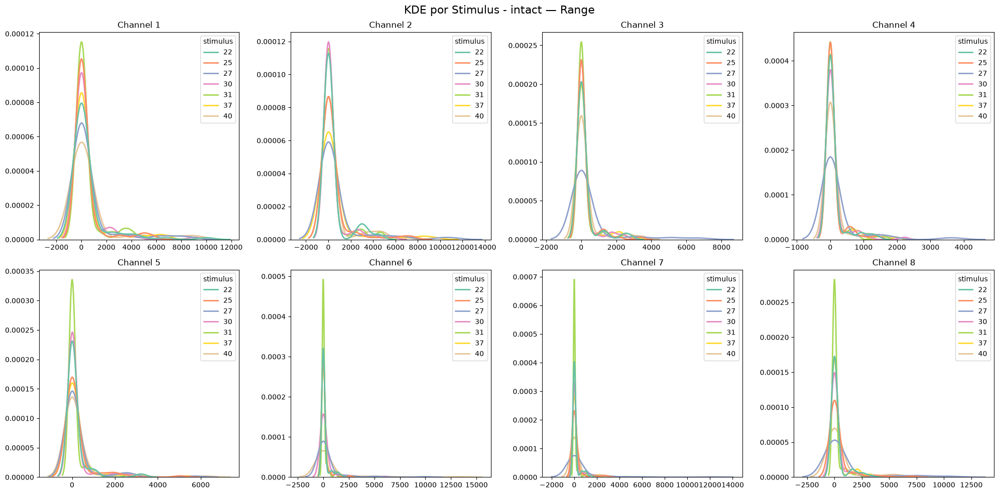

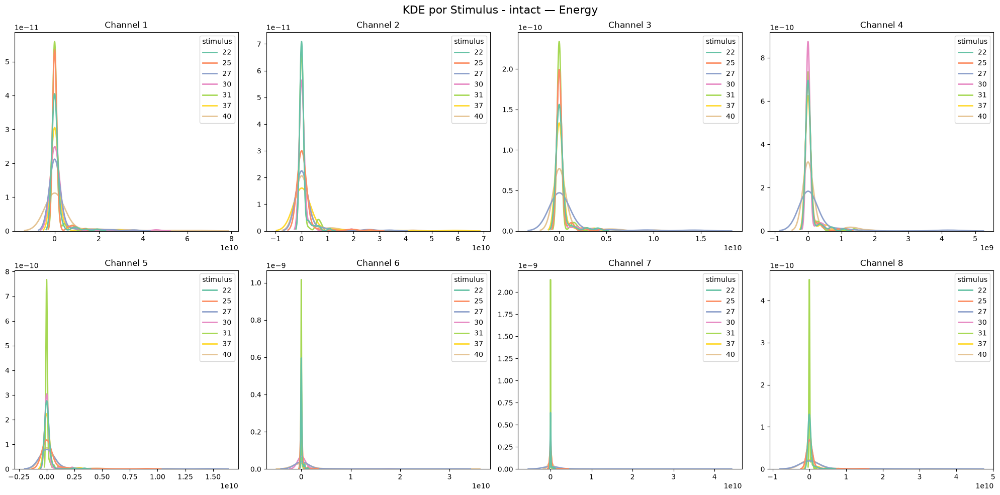

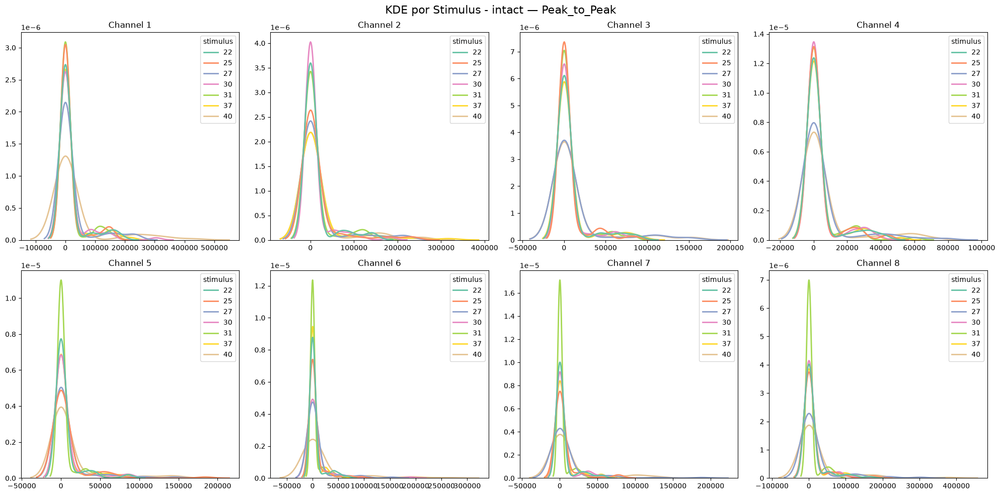

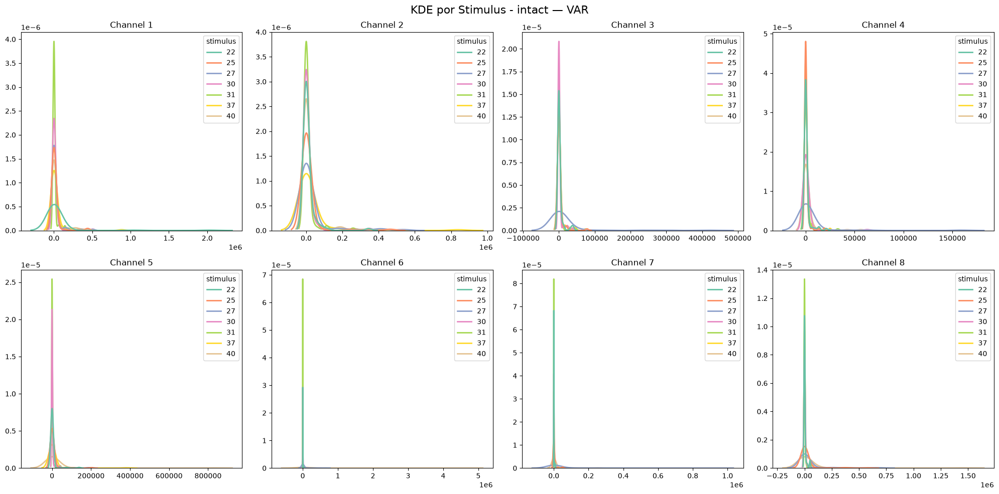

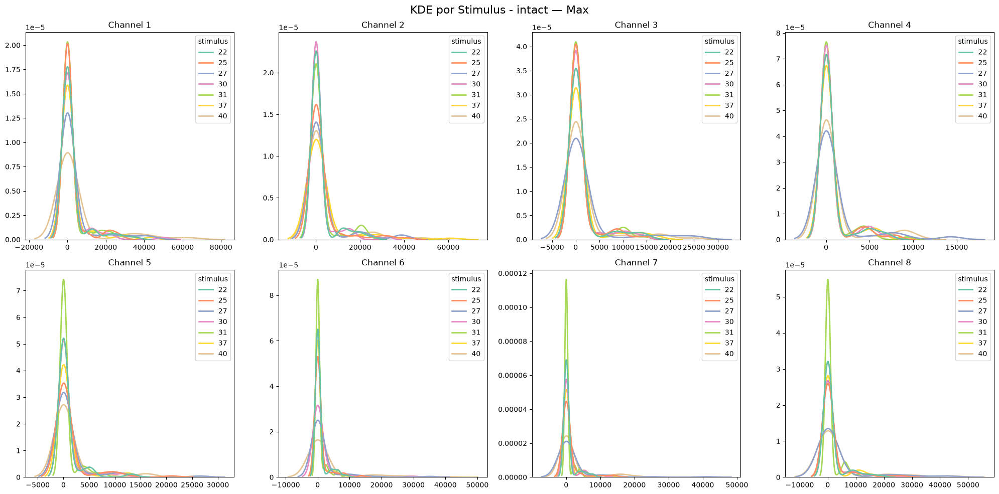

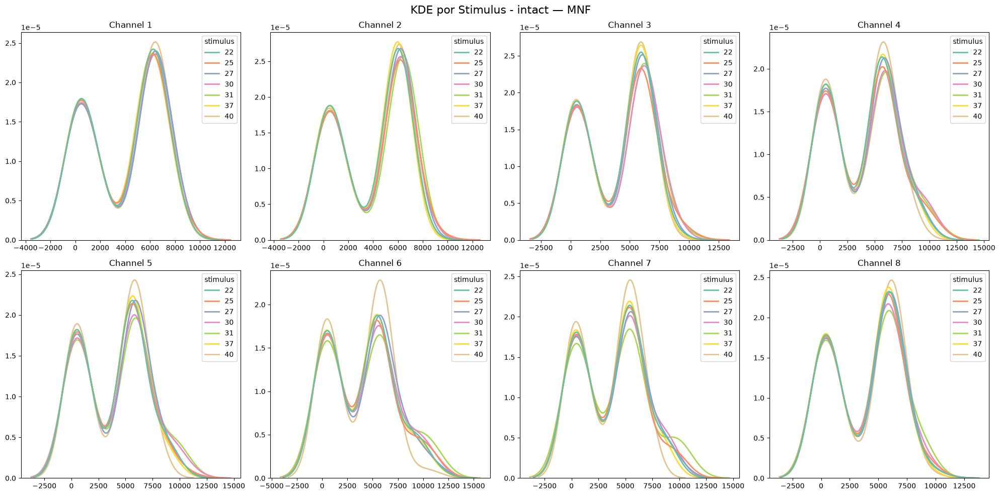

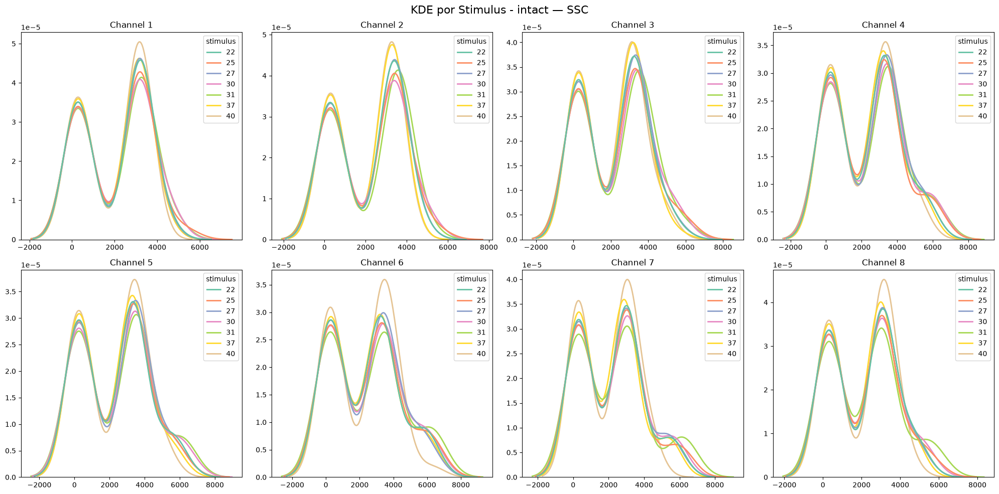

In [61]:
features = ['VAR_STD', 'Range', 'Energy', 'Peak_to_Peak', 'VAR', 'Max', 'MNF', 'SSC']
for feat in features:
        plot_kde_by_channel(intact, feat, f'KDE por Stimulus - intact')

## Box-cox Transformation

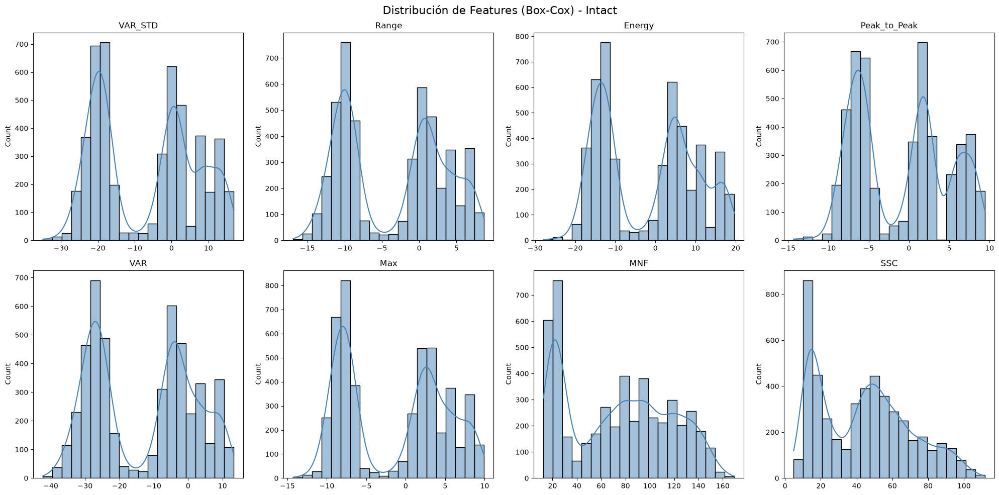

In [62]:
plot_histograms_by_channel(df_boxcox_intact, 'Distribución de Features (Box-Cox) - Intact')

In [63]:
get_features_summary_table(df_boxcox_intact)

,Característica,Mín,Máx,Rango,Media,Desv. Est.
0,VAR_STD,-34.928963,16.885111,51.814073,-6.749987,13.352351
1,Range,-16.903682,8.694363,25.598045,-3.404987,6.784062
2,Energy,-27.928125,19.684906,47.613031,-1.872499,11.808978
3,Peak_to_Peak,-14.299432,9.396756,23.696187,-0.932231,5.674762
4,VAR,-42.298720,13.303764,55.602485,-12.873152,14.579758
5,Max,-14.273997,9.931934,24.205931,-1.424458,6.470980
6,MNF,12.506373,169.546916,157.040543,73.766099,42.653451
7,SSC,4.832361,111.585521,106.753160,44.197485,25.502563


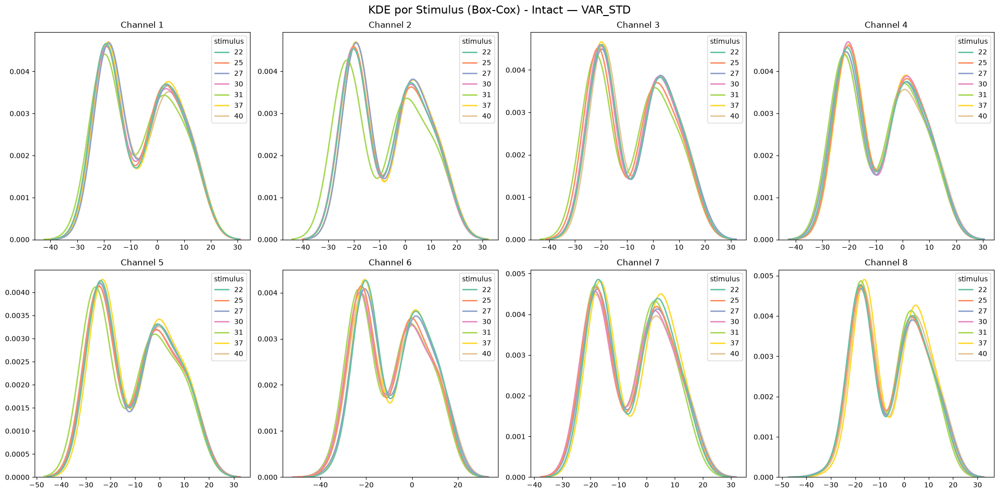

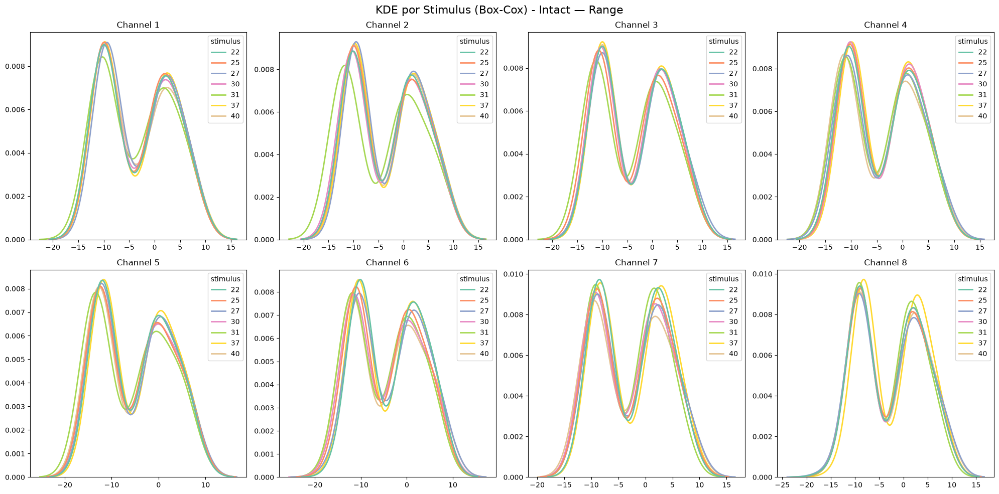

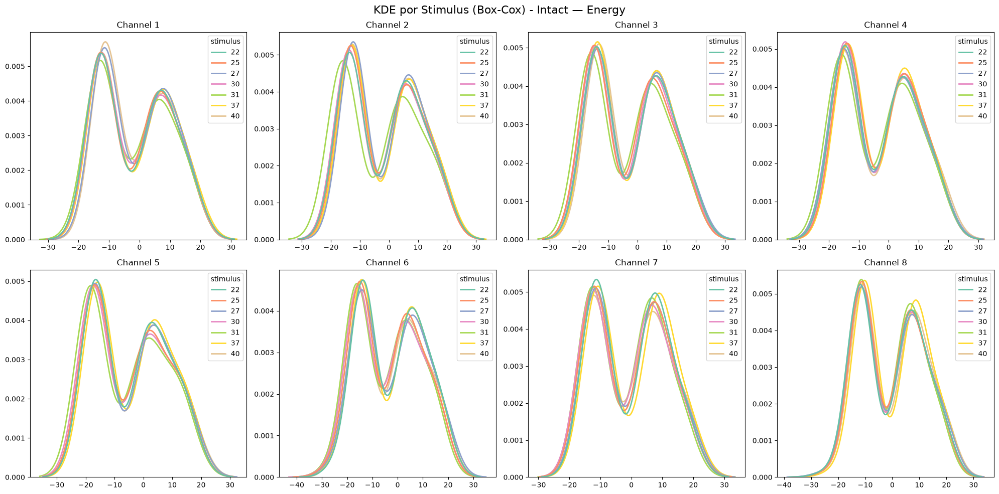

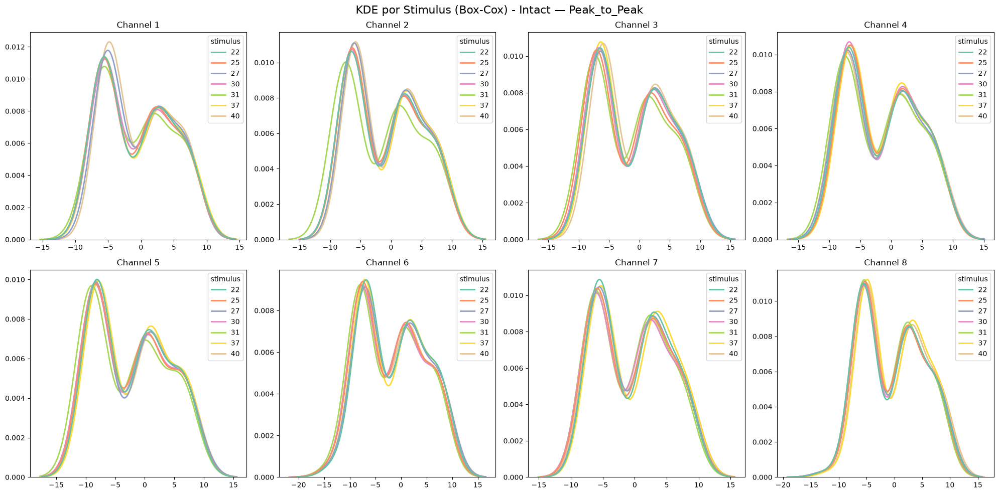

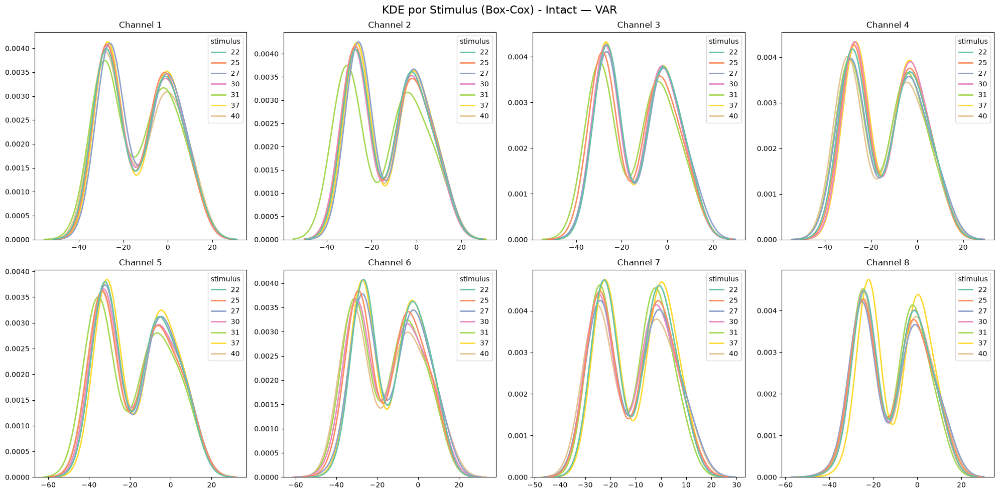

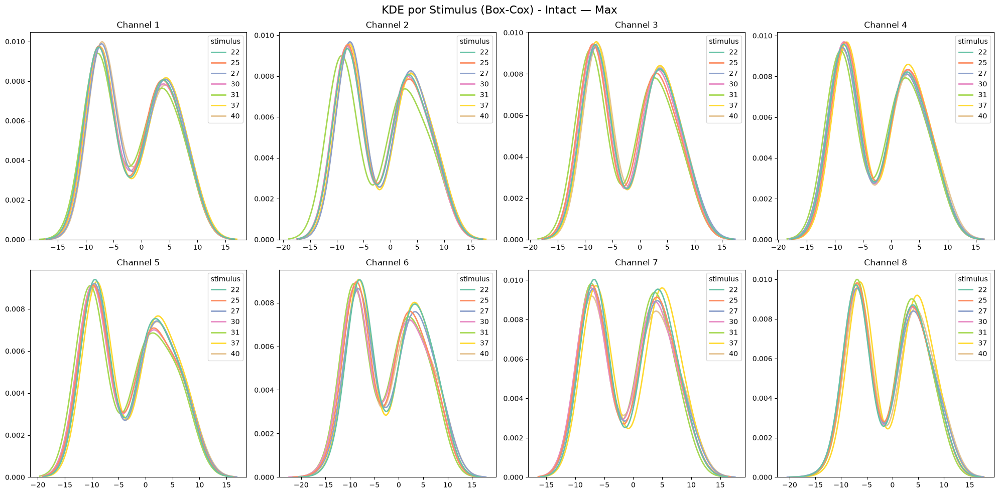

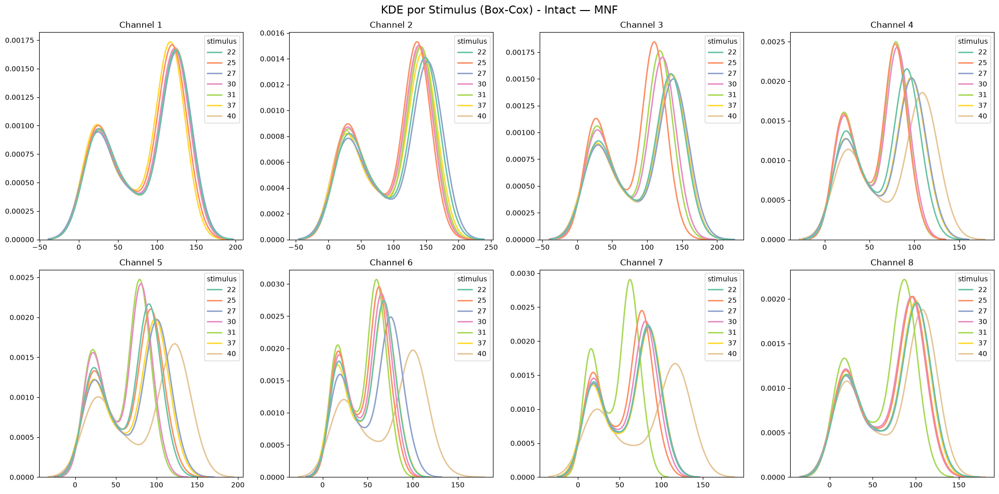

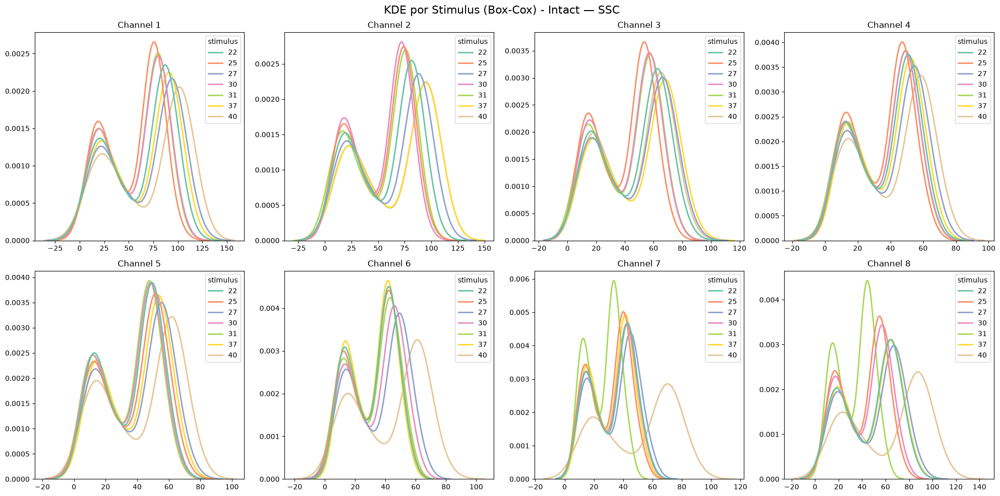

In [64]:
features = ['VAR_STD', 'Range', 'Energy', 'Peak_to_Peak', 'VAR', 'Max', 'MNF', 'SSC']
for feat in features:
        plot_kde_by_channel(df_boxcox_intact, feat, f'KDE por Stimulus (Box-Cox) - Intact')

## Yeo-Johnson Transformation

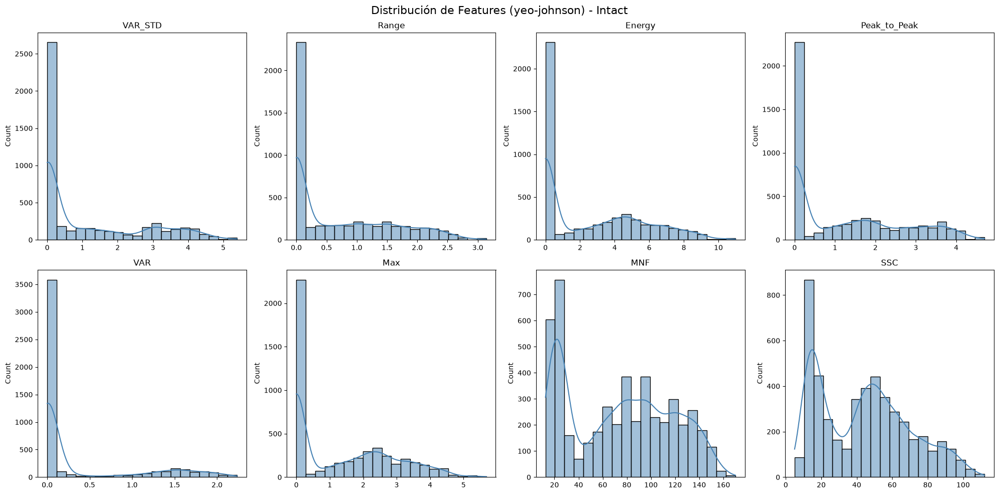

In [65]:
plot_histograms_by_channel(df_yeojohnson_intact, 'Distribución de Features (yeo-johnson) - Intact')

In [66]:
get_features_summary_table(df_yeojohnson_intact)

,Característica,Mín,Máx,Rango,Media,Desv. Est.
0,VAR_STD,1.330848e-12,5.392844,5.392844,1.134709,1.526071
1,Range,4.079968e-07,3.140203,3.140203,0.701034,0.835995
2,Energy,4.843963e-10,10.978357,10.978357,2.627366,2.935059
3,Peak_to_Peak,2.885109e-05,4.698909,4.698881,1.231751,1.381422
4,VAR,6.807607e-16,2.236624,2.236624,0.358176,0.652565
5,Max,5.702248e-06,5.679544,5.679538,1.358493,1.475252
6,MNF,1.256209e+01,169.945739,157.383650,73.915864,42.741617
7,SSC,4.973610e+00,112.040237,107.066627,44.291004,25.561281


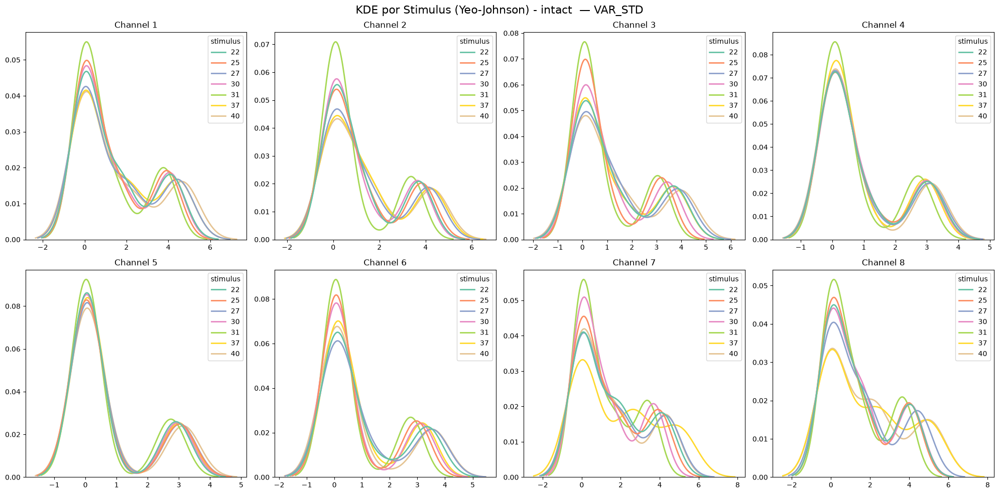

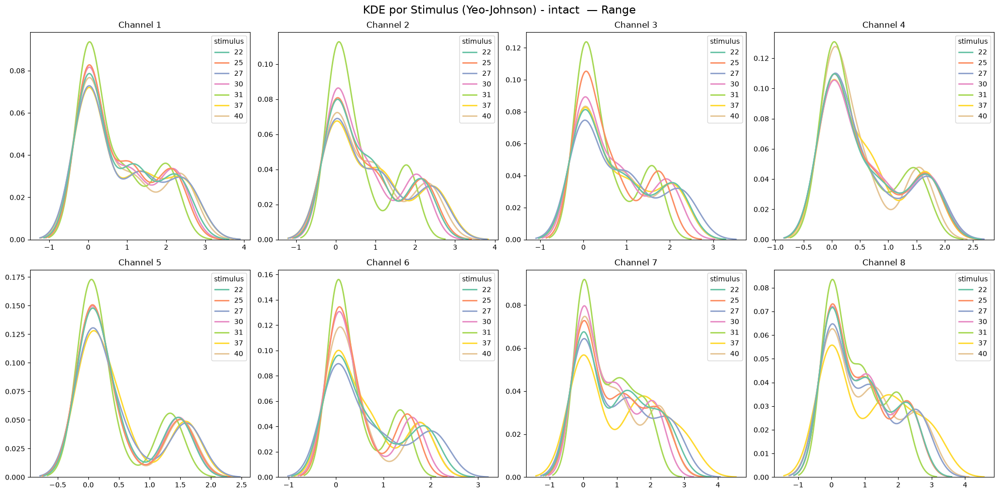

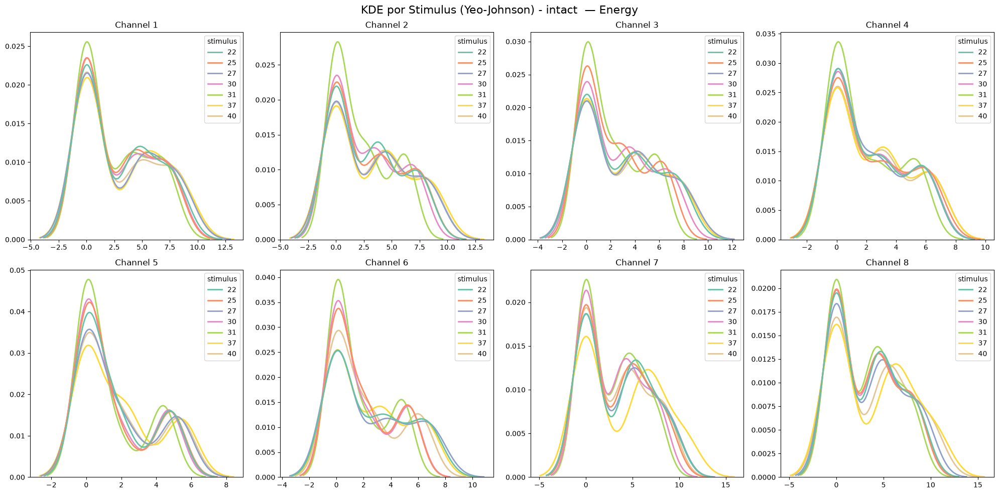

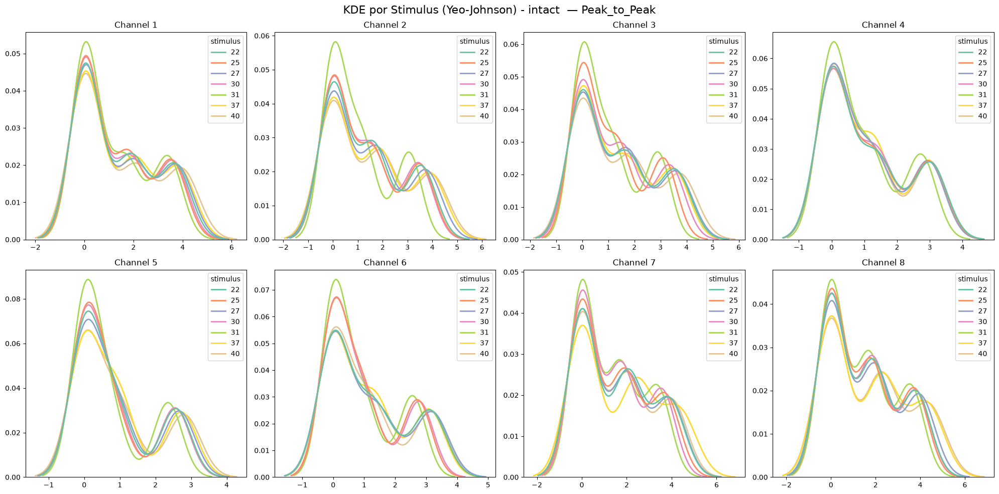

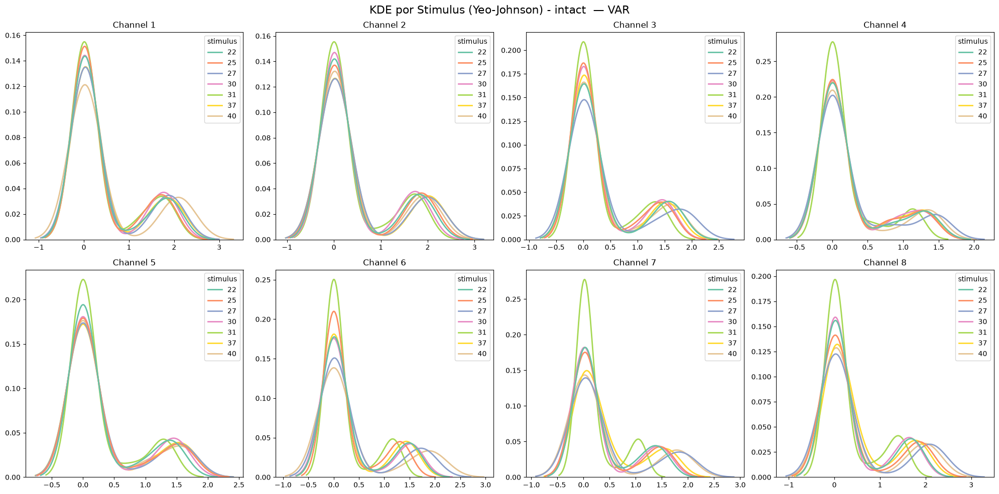

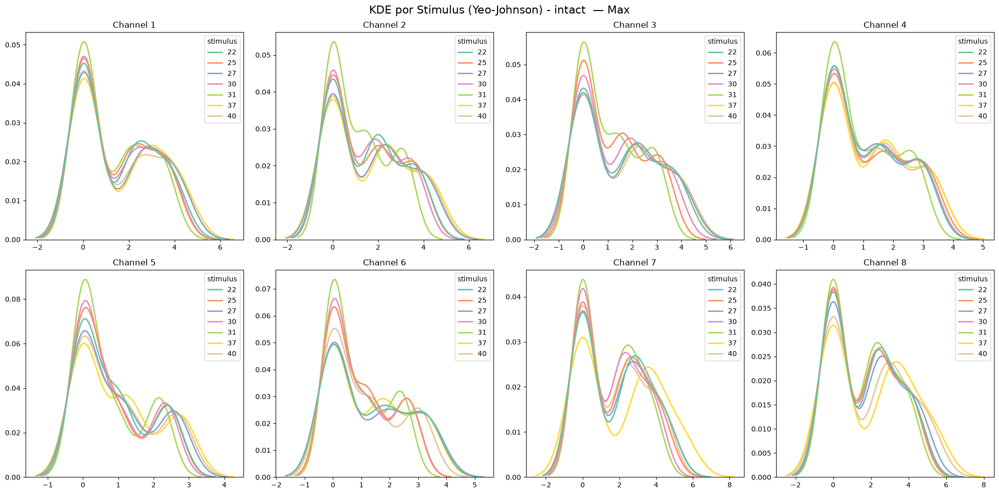

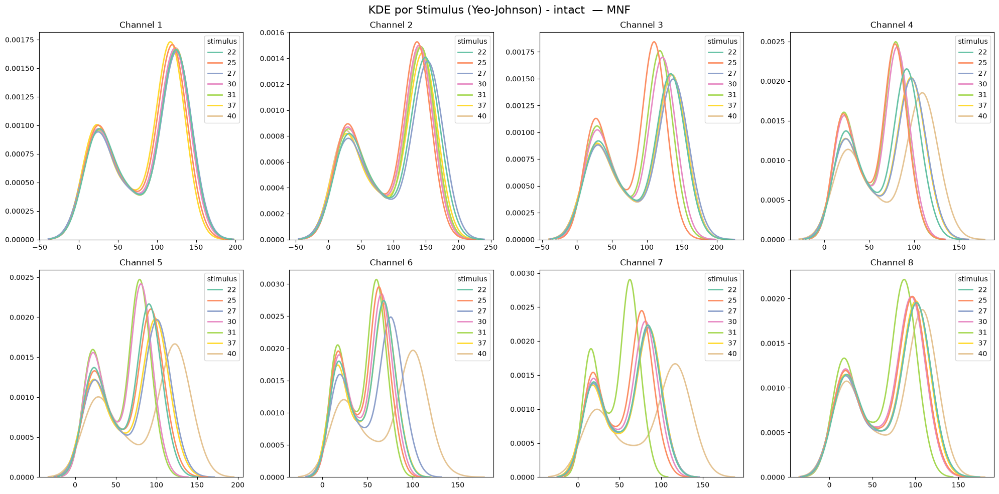

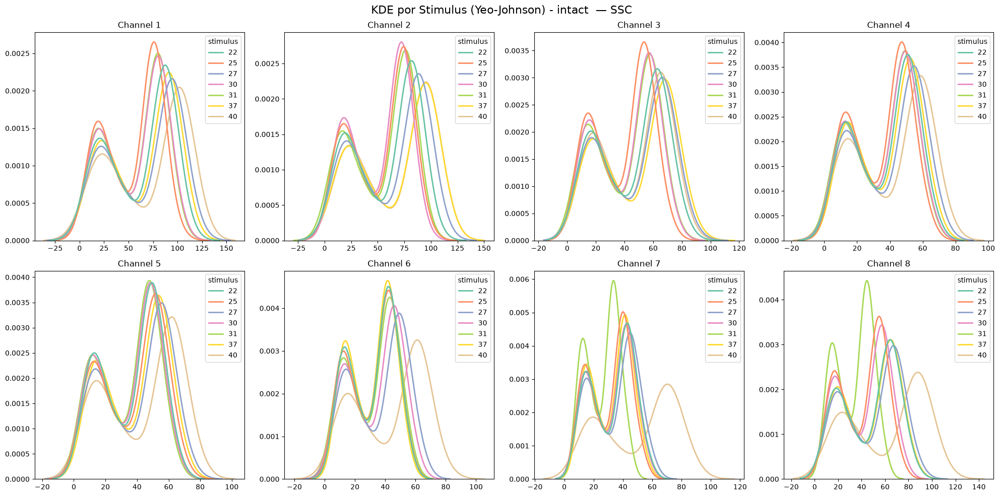

In [67]:
features = ['VAR_STD', 'Range', 'Energy', 'Peak_to_Peak', 'VAR', 'Max', 'MNF', 'SSC']
for feat in features:
        plot_kde_by_channel(df_yeojohnson_intact, feat, f'KDE por Stimulus (Yeo-Johnson) - intact ')

## Guardado de todas las gráficas

El siguiente bloque crea `figures/transformation/` y organiza las gráficas en las carpetas `original`, `box_cox` y `yeo_johnson`.

In [68]:
from pathlib import Path

output_dir = Path('../figures/transformation')


def save_histogram(df, title, output_path):
    if output_path.exists():
        return

    fig, axes = plt.subplots(2, 4, figsize=(20, 10))
    fig.suptitle(title, fontsize=16)

    for index, feature in enumerate(features):
        ax = axes[index // 4][index % 4]
        values = df[[f'Channel {channel}_{feature}' for channel in range(1, 9)]].to_numpy().flatten()
        values = values[~np.isnan(values)]
        sns.histplot(values, kde=True, ax=ax, bins=20, color='steelblue')
        ax.set_title(feature, fontsize=12)
        ax.set_xlabel('')

    fig.subplots_adjust(top=0.90, wspace=0.25, hspace=0.30)
    fig.savefig(output_path, dpi=150)
    plt.close(fig)


def save_kde_by_channel(df, feature, title, output_path):
    if output_path.exists():
        return

    fig, axes = plt.subplots(2, 4, figsize=(20, 10))
    fig.suptitle(f'{title} - {feature}', fontsize=16)

    for channel in range(1, 9):
        ax = axes[(channel - 1) // 4][(channel - 1) % 4]
        column = f'Channel {channel}_{feature}'
        df_plot = df[['stimulus', column]].rename(columns={column: 'value'})
        sns.kdeplot(
            data=df_plot,
            x='value',
            hue='stimulus',
            ax=ax,
            palette='Set2',
            fill=False,
            linewidth=2
        )
        ax.set_title(f'Channel {channel}', fontsize=12)
        ax.set_xlabel('')
        ax.set_ylabel('')

    fig.subplots_adjust(top=0.90, wspace=0.25, hspace=0.30)
    fig.savefig(output_path, dpi=150)
    plt.close(fig)


datasets = {
    'original': intact,
    'box_cox': df_boxcox_intact,
    'yeo_johnson': df_yeojohnson_intact,
}

for dataset_name, dataset in datasets.items():
    dataset_dir = output_dir / dataset_name
    dataset_dir.mkdir(parents=True, exist_ok=True)

    save_histogram(
        dataset,
        f'Distribución de Features - {dataset_name}',
        dataset_dir / 'histogramas.png'
    )

    for feature in features:
        save_kde_by_channel(
            dataset,
            feature,
            f'KDE por Stimulus - {dataset_name}',
            dataset_dir / f'kde_{feature.lower()}.png'
        )

print(f'Gráficas guardadas en: {output_dir.resolve()}')

Gráficas guardadas en: /home/Felixphz/project/sEMG-ArmBand/figures/transformation
